In [1]:
%reset -f

In [2]:
import requests
from pathlib import Path
import requests
from bs4 import BeautifulSoup
import re
import os
import zipfile

### Scrape Shape Files

In [3]:
# URL of the website you want to scrape
url = "https://datos.cdmx.gob.mx/dataset/catalogo-de-colonias-datos-abiertos"

# Send an HTTP request to the URL
response = requests.get(url)

In [4]:
# Check if the request was successful (status code 200)
if response.status_code == 200:
    # Parse the HTML content of the page
    soup = BeautifulSoup(response.text, 'html.parser')
    
    # Find all the links on the page
    links = soup.find_all('a', class_='dataset-resource')
    
    # Loop through each link to find the one with the name "Catálogo de colonias"
    for link in links:
        if "Catálogo de colonias" in link.text:
            # Get the URL of the shapefile
            shapefile_url = link.get('href')
            print("Shapefile URL:", shapefile_url)
            
            # Download the shapefile
            filename = shapefile_url.split("/")[-1]  # Extracting filename from URL
            with open(filename, 'wb') as f:
                response = requests.get(shapefile_url)
                f.write(response.content)
                
            print("Shapefile downloaded successfully as:", filename)
            break
else:
    print("Failed to retrieve the webpage. Status code:", response.status_code)

In [5]:
# Find all <a> tags
all_links = soup.find_all('a')

# Extract URLs from the href attribute of <a> tags
urls = [link.get('href') for link in all_links]

# Print the URLs
for url in urls:
    print("Shapefile URL:", url)

Shapefile URL: #content
Shapefile URL: /
Shapefile URL: /
Shapefile URL: /dataset/
Shapefile URL: /dataset/victimas-en-carpetas-de-investigacion-fgj/resource/d543a7b1-f8cb-439f-8a5c-e56c5479eeb5
Shapefile URL: https://plandeapertura.cdmx.gob.mx/
Shapefile URL: /organization/agencia-digital-de-innovacion-publica
Shapefile URL: /organization/about/agencia-digital-de-innovacion-publica
Shapefile URL: https://creativecommons.org/licenses/by/4.0/deed.es
Shapefile URL: http://opendefinition.org/okd/
Shapefile URL: https://www.facebook.com/sharer.php?u=https://datos.cdmx.gob.mx/dataset/catalogo-de-colonias-datos-abiertos
Shapefile URL: https://twitter.com/share?url=https://datos.cdmx.gob.mx/dataset/catalogo-de-colonias-datos-abiertos
Shapefile URL: /dataset/catalogo-de-colonias-datos-abiertos
Shapefile URL: /dataset/groups/catalogo-de-colonias-datos-abiertos
Shapefile URL: /dataset/activity/catalogo-de-colonias-datos-abiertos
Shapefile URL: mailto:datoasabiertos@cdmx.gob.mx?subject=Dudas sobr

In [6]:
# Filter out the URL that ends with ".zip"
zip_url = next((url for url in urls if url.endswith('.zip')), None)

# Define the folder name
folder_name = "Shape files"

# Download the zip file into the folder
if zip_url:
    # Extract the file name from the URL
    file_name = os.path.basename(zip_url)
    file_path = os.path.join(folder_name, file_name)
    
    # Send a GET request to download the file
    response = requests.get(zip_url)
    
    # Check if the request was successful
    if response.status_code == 200:
        # Save the file
        with open(file_path, 'wb') as file:
            file.write(response.content)
        print(f"File '{file_name}' downloaded successfully into '{folder_name}' folder.")
    else:
        print("Failed to download the file.")
else:
    print("No zip file found.")

File 'poligonos_colonias_cdmx.zip' downloaded successfully into 'Shape files' folder.


In [7]:
# Define the path to the downloaded zip file
zip_file_path = os.path.join(folder_name, file_name)

# Unzip the file into the main folder
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(folder_name)

# Remove the zip file
os.remove(zip_file_path)

print("Zip file extracted and removed successfully.")

Zip file extracted and removed successfully.


### Inspect shape file and clean resulting geodataframe

In [104]:
# Import additional libraries

import geopandas as gpd
import pandas as p
import matplotlib.pyplot as plt
import numpy as np

In [141]:
# Import shape file

# Get a list of all files in the folder
files = os.listdir(folder_name)

# Find the file ending with .shp
for file in files:
    if file.endswith(".shp"):
        file_name = file
        break

colonias_cdmx = gpd.read_file(os.path.join(folder_name, file_name))
colonias_cdmx.head(3)

,cve_ent,entidad,cve_alc,alc,cve_col,colonia,clasif,geometry
0,09,Ciudad de México,002,Azcapotzalco,002-001,Aguilera,Colonia,"POLYGON ((-99.15913 19.47261, -99.15906 19.473..."
1,09,Ciudad de México,002,Azcapotzalco,002-002,Aldana,Colonia,"POLYGON ((-99.15171 19.46819, -99.15157 19.469..."
2,09,Ciudad de México,002,Azcapotzalco,002-003,Ampliacion Cosmopolita,Colonia,"POLYGON ((-99.16362 19.47223, -99.16334 19.472..."


<AxesSubplot:>

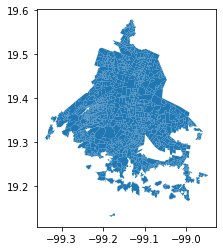

In [142]:
# Visualize resulting map

colonias_cdmx.plot()

In [143]:
# Access the first Polygon geometry
polygon_geometry = colonias_cdmx.geometry.iloc[0]

# Access the exterior ring coordinates
exterior_coords = polygon_geometry.exterior.coords

# Convert exterior coordinates to a list of tuples
exterior_coords_list = list(exterior_coords)

# Print the coordinates
print("Exterior Coordinates:", exterior_coords_list)

Exterior Coordinates: [(-99.15913100449802, 19.472611755223394), (-99.15905951558408, 19.473285887676024), (-99.1590088146109, 19.47368593671133), (-99.15794643848542, 19.473632739085684), (-99.15616814209562, 19.47354369195322), (-99.15442193075381, 19.473380151110387), (-99.15266341191717, 19.47321472340822), (-99.15275750249316, 19.47264915251562), (-99.1528071338663, 19.4723511157457), (-99.15292459787698, 19.47167601389273), (-99.15351363460762, 19.471764378693692), (-99.15501209831677, 19.47198914429913), (-99.15500458310345, 19.472030004073765), (-99.15510539658004, 19.47200313753843), (-99.15520542932478, 19.47197558462651), (-99.15519777130277, 19.472016986193644), (-99.15580174927318, 19.472107529770657), (-99.15640573743234, 19.47219806231646), (-99.15814628678987, 19.472462267199276), (-99.15913100449802, 19.472611755223394)]


In [144]:
colonias_cdmx.geometry.isna().any()

False

In [145]:
# View current crs

colonias_cdmx.crs

<Geographic 2D CRS: GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84" ...>
Name: WGS 84
Axis Info [ellipsoidal]:
- lon[east]: Longitude (Degree)
- lat[north]: Latitude (Degree)
Area of Use:
- undefined
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [146]:
# Use Mexico ITRF92 projection

colonias_cdmx = colonias_cdmx.to_crs("EPSG:6362")
colonias_cdmx.crs

<Projected CRS: EPSG:6362>
Name: Mexico ITRF92 / LCC
Axis Info [cartesian]:
- N[north]: Northing (metre)
- E[east]: Easting (metre)
Area of Use:
- name: Mexico - onshore and offshore.
- bounds: (-122.19, 12.1, -84.64, 32.72)
Coordinate Operation:
- name: Mexico LCC
- method: Lambert Conic Conformal (2SP)
Datum: Mexico ITRF92
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [147]:
# Calculate area of each colonia

colonias_cdmx['area'] = colonias_cdmx.area
colonias_cdmx['area'].sum() 

734165339.2720687

<AxesSubplot:>

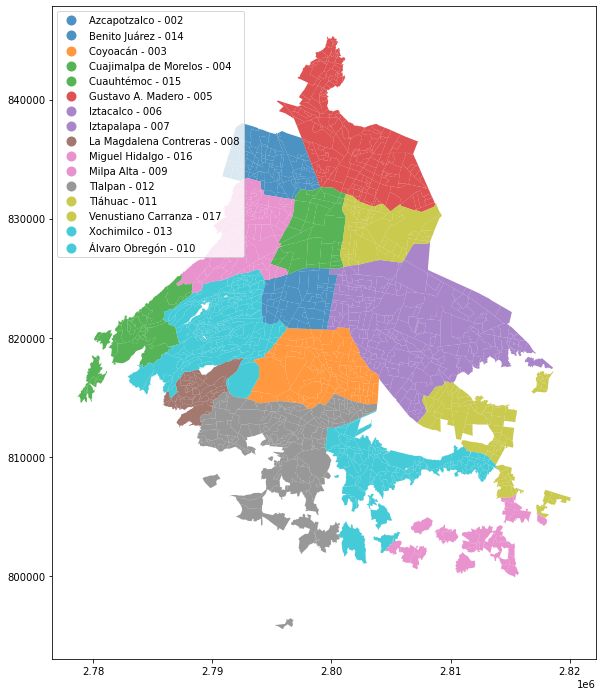

In [148]:
# Visualize alcaldías

colonias_cdmx.assign(alc_cod=colonias_cdmx['alc'] + ' - ' + colonias_cdmx['cve_alc']).plot(column='alc_cod', legend=True, figsize=(20, 12), legend_kwds={'loc': 'upper left'}, alpha = 0.8)


In [158]:
import folium
from shapely.geometry import Point
import matplotlib.pyplot as plt

In [165]:
import matplotlib.colors as mcolors
import numpy as np

# Ensure colonias_cdmx is in the WGS84 coordinate system
colonias_cdmx = colonias_cdmx.to_crs(epsg=4326)

# Define a color palette
unique_alc = colonias_cdmx['alc'].unique()
num_alc = len(unique_alc)

# Using a colormap that provides enough unique colors
color_palette = plt.get_cmap('tab20b', num_alc)

# Convert RGB colors to hex format
color_map = {alc: mcolors.rgb2hex(color_palette(i / num_alc)) for i, alc in enumerate(unique_alc)}

# Convert GeoDataFrame to GeoJSON
geojson_data = colonias_cdmx.to_json()

# Determine the center of the map
center = colonias_cdmx.geometry.centroid.unary_union.centroid

# Create the folium map centered around the calculated center 
m = folium.Map(location=[center.y, center.x], zoom_start=11, tiles='https://maps.wikimedia.org/osm-intl/{z}/{x}/{y}.png', attr='Wikimedia')

# Define the style function with dynamic color assignment based on 'alc'
def style_function(feature):
    alc = feature['properties']['alc']
    return {
        'fillColor': color_map[alc],
        'color': 'black',
        'weight': 1,
        'fillOpacity': 0.4  # Adjusted for visibility
    }

# Modify the highlight function for 'anti-highlight'
def highlight_function(feature):
    return {
        'fillColor': '#ffffff',  # 'Un-highlight' color, making it blend in or stand out
        'color': 'black',
        'weight': 1,
        'fillOpacity': 0 # Lower opacity to 'clear' the area
    }

# Add the GeoJSON layer with dynamic styling and 'anti-highlight' functionality
folium.GeoJson(
    geojson_data,
    style_function=style_function,
    highlight_function=highlight_function,
    tooltip=folium.GeoJsonTooltip(fields=['colonia', 'alc'], aliases=['Colonia:', 'Alcaldía:'], labels=True)
).add_to(m)

# Display the map
m



<ipython-input-165-45e751bb9d2c>:21: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center = colonias_cdmx.geometry.centroid.unary_union.centroid
